# Сжатие изображения без потери качества при помощи PCA

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2

from scipy.stats import stats
from sklearn.decomposition import PCA

Загрузим картинку и нарисуем ее в монохромный формат

In [5]:
%%capture
!wget -O flower.png "https://www.dropbox.com/s/xoos0myk285efyu/flower.png?dl=0"

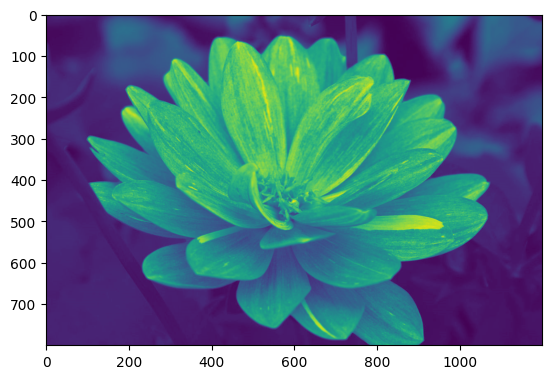

In [8]:
img = cv2.cvtColor(cv2.imread('flower.png'), cv2.COLOR_BGR2GRAY)
plt.imshow(img)
plt.show()

## Вопрос для Quiz

Какого размера картинка img? В ответе запишите общее число пикселей.

In [9]:
img.shape

(800, 1200)

Посмотрим на матрицу изображения

In [10]:
img

array([[16, 16, 16, ..., 10, 10, 10],
       [16, 16, 16, ..., 10, 10, 10],
       [16, 16, 16, ..., 10, 10, 10],
       ...,
       [19, 19, 19, ..., 10, 10, 10],
       [19, 19, 19, ..., 10, 10, 10],
       [19, 19, 19, ..., 10, 10, 10]], dtype=uint8)

### Сейчас будем делать PCA

**Задание.** Масштабируйте данные, поделив значения в матрице на 255

In [11]:
img = img / 255

**Задание.** Обучите PCA с 50-ю компонентами. Снизьте размерность.

In [12]:
pca = PCA(n_components=50)

img_transformed = pca.fit_transform(img)

In [13]:
img_transformed

array([[-6.50385082e+00,  9.77155669e-01, -3.31493890e+00, ...,
         2.32560915e-01, -3.56818647e-02,  2.08680001e-01],
       [-6.49767003e+00,  9.63371172e-01, -3.34517663e+00, ...,
         2.32923500e-01, -4.32475863e-02,  2.09549436e-01],
       [-6.48469806e+00,  9.38776550e-01, -3.38259878e+00, ...,
         2.27054992e-01, -4.64011351e-02,  2.13448344e-01],
       ...,
       [-7.62989560e+00,  1.97651200e+00,  1.49473415e+00, ...,
         8.71653942e-02, -3.58731802e-03,  9.03923186e-03],
       [-7.66892621e+00,  1.90829202e+00,  1.46977048e+00, ...,
         3.50252420e-02,  4.87575064e-02, -5.37258867e-02],
       [-7.71692180e+00,  1.83551666e+00,  1.41934789e+00, ...,
        -1.18582924e-02,  8.42109765e-02, -9.41530932e-02]])

## Вопрос для Quiz

Выведите на экран долю дисперсии, объясняемой первыми 50-ю главными компонентами. Ответ округлите до сотых.

In [14]:
prop = pca.explained_variance_ratio_
prop.sum()

np.float64(0.9854894579569681)

**Задание.** Нарисуйте график, на котором отобразите долю дисперсии, объясняемой каждой из первых 50-ти компонент.

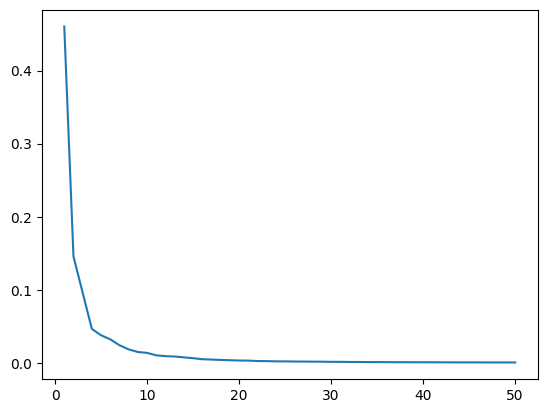

In [15]:
pc_numbers = np.arange(pca.n_components_) + 1

plt.plot(pc_numbers, prop)
plt.show()

### Восстанавливаем изображение

**Задание.** Восстановите изображение, используя pca.inverse_transform.

In [16]:
img_inverse = pca.inverse_transform(img_transformed)

In [19]:
img_inverse *= 255

**Задание.** Нарисуйте рядом два изображения: исходное и восстановленное (по своим 50 компонентам).

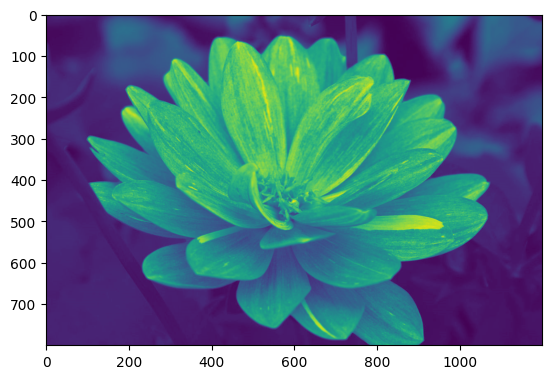

In [20]:
plt.imshow(img)
plt.show()

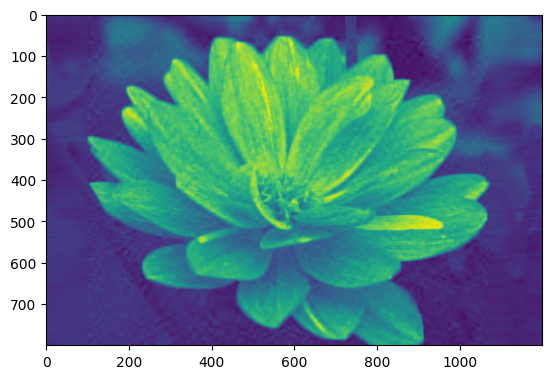

In [21]:
plt.imshow(img_inverse)
plt.show()

## Вопрос для Quiz

Упало ли визуально качество при сжатии изображения до 50 главных компонент?

## Вопрос для Quiz

Подберите минимальное количество компонент, при которых сжатое изображение визуально практически не отличается от исходного. Подбор происходит перебором, ориентируемся на визуальный результат.

50


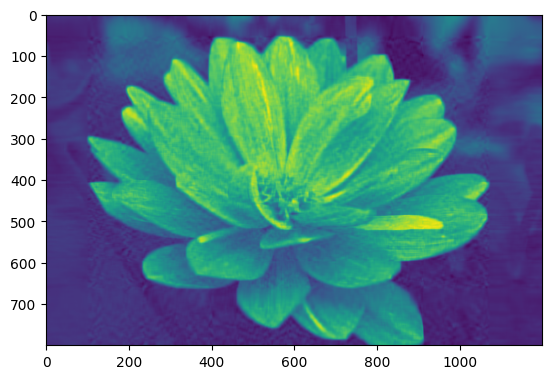

55


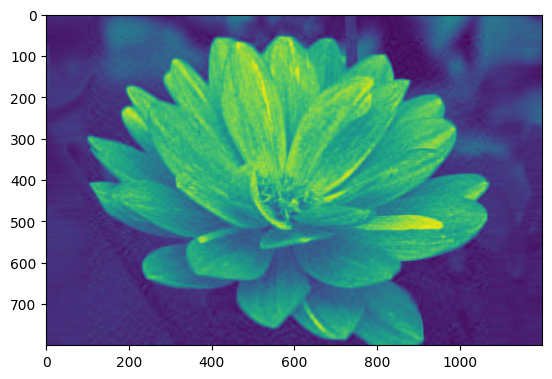

60


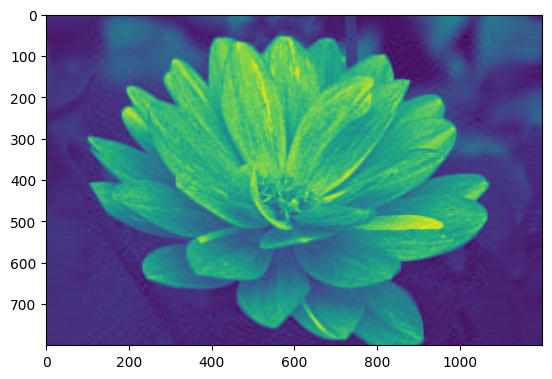

65


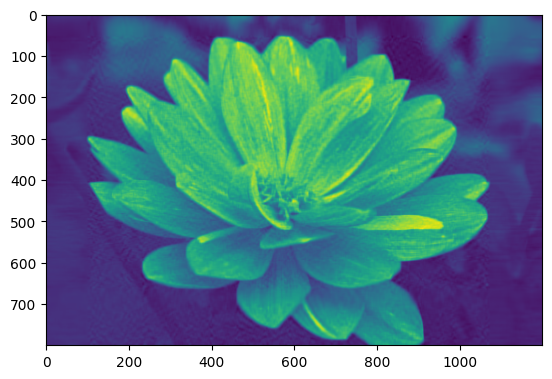

70


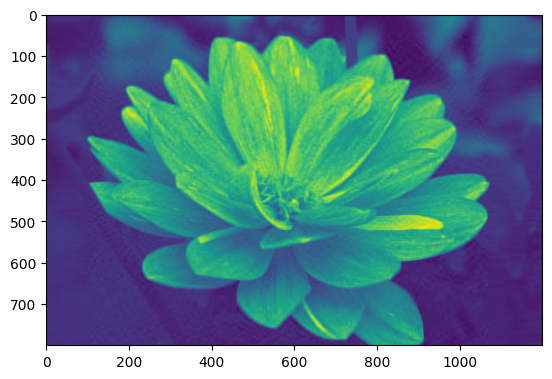

75


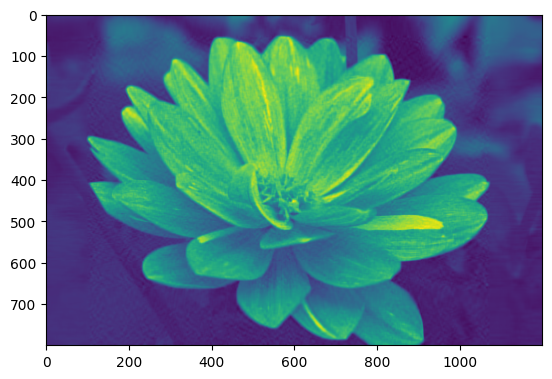

80


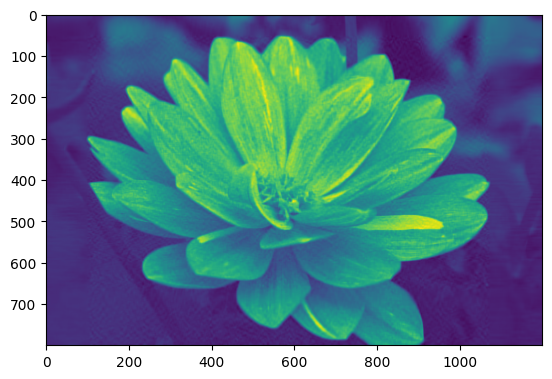

85


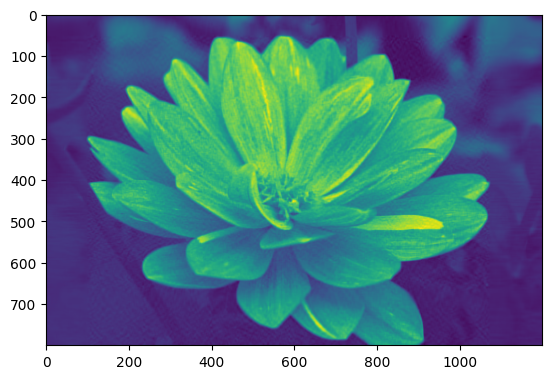

90


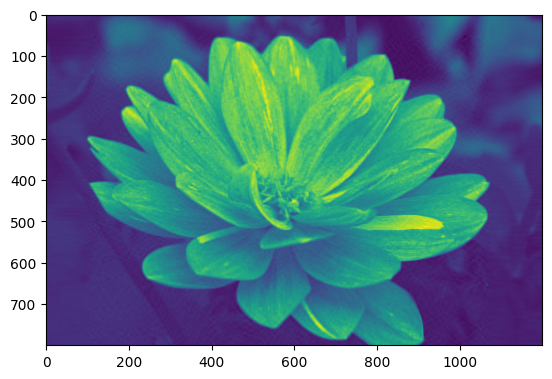

95


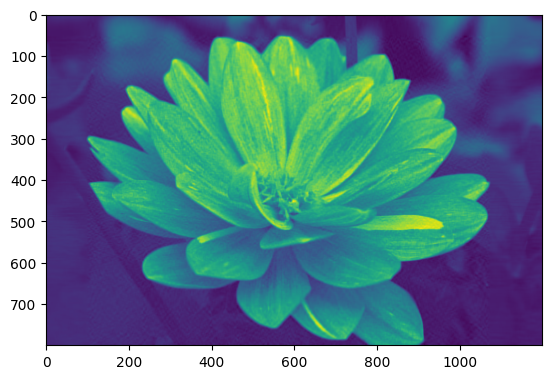

In [26]:
for n in np.arange(50, 100, 5):
    print(n)
    pca = PCA(n_components=n)
    new_img = pca.fit_transform(img)
    new_img_inverse = pca.inverse_transform(new_img)
    plt.imshow(new_img_inverse)
    plt.show()

## Бонус

Попробуйте проделать все действия ноутбука, но уже с цветным изображением.

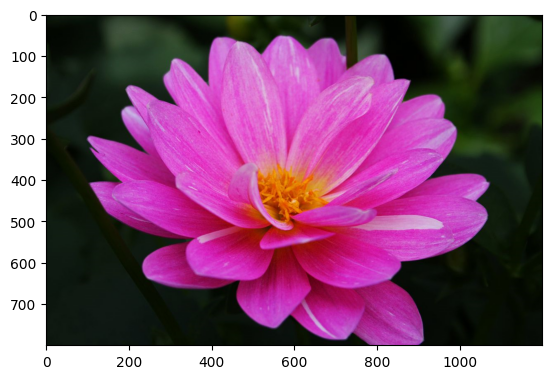

In [27]:
img = cv2.cvtColor(cv2.imread('flower.png'), cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

Отличия от предыдущих шагов заключаются в том, что цветное RGB-изображение состоит из трех каналов - это матрица яркостей красного, матрица яркостей зеленого и матрица яркостей синего цветов.

Номер канала - последняя размерность в объекте `img`.
Например, матрица яркости красного - это `img[:,:,0]`.

Все действия выше нужно проделать с каждым каналом в отдельности, а потом объединить преобразованные изображения для каждого канала - чтобы получить итоговую картинку со сниженной размерностью.

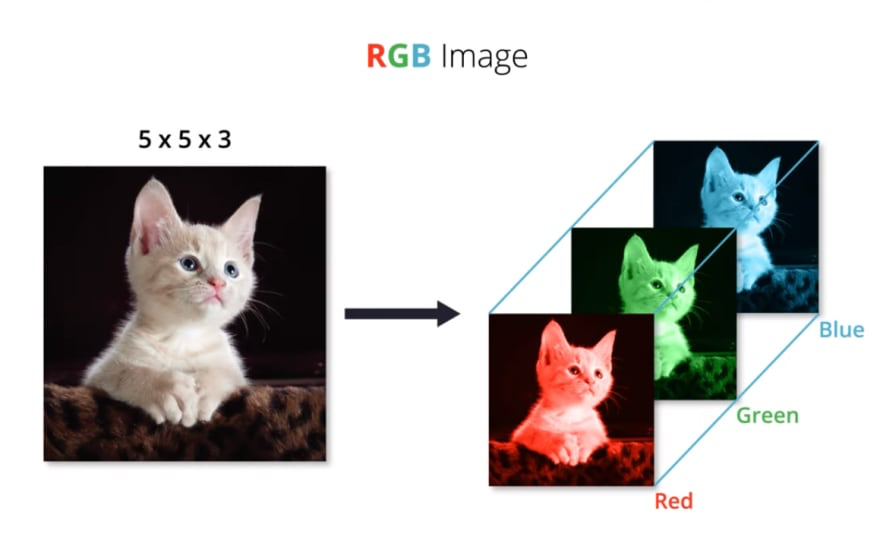

In [79]:
r = img[:, :, 0]
g = img[:, :, 1]
b = img[:, :, 2]
r = r / 255
g = g / 255
b = b / 255

Source:


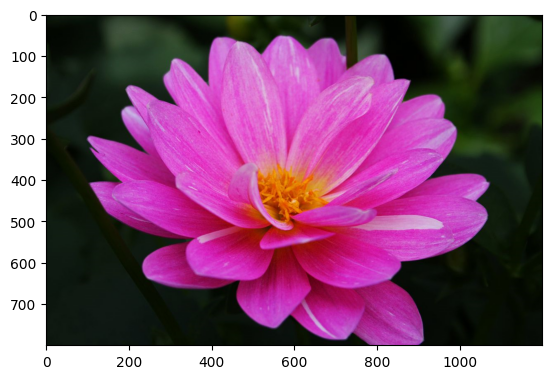

50
Result:


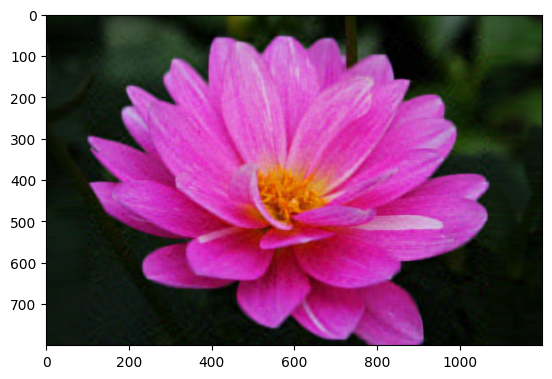

100
Result:


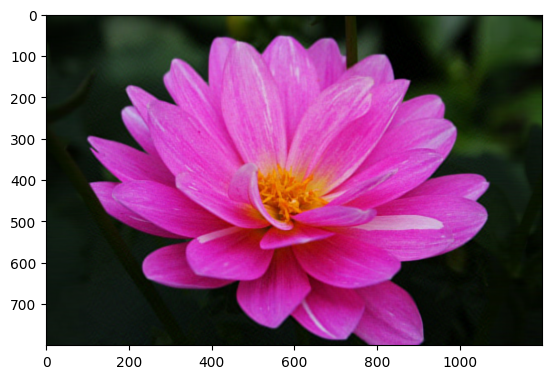

150
Result:


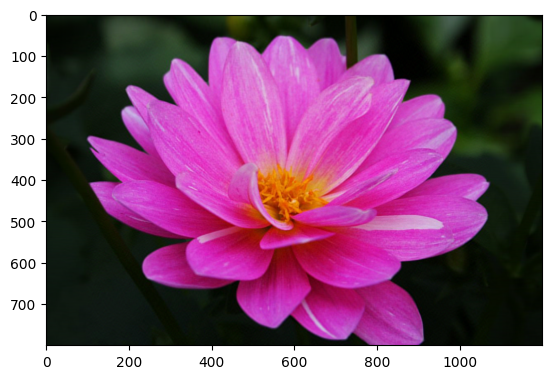

200
Result:


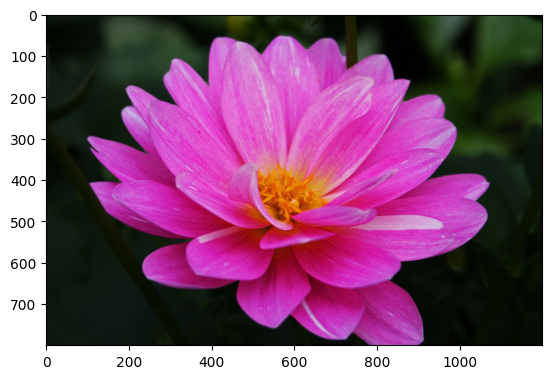

250
Result:


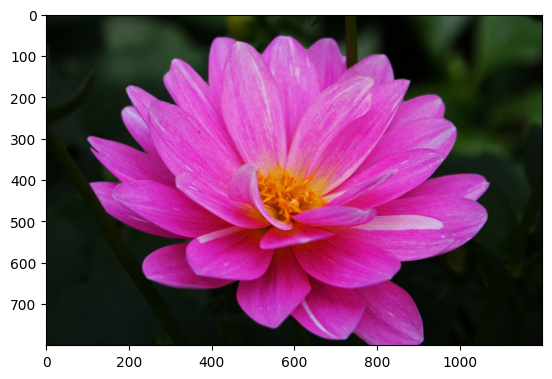

300
Result:


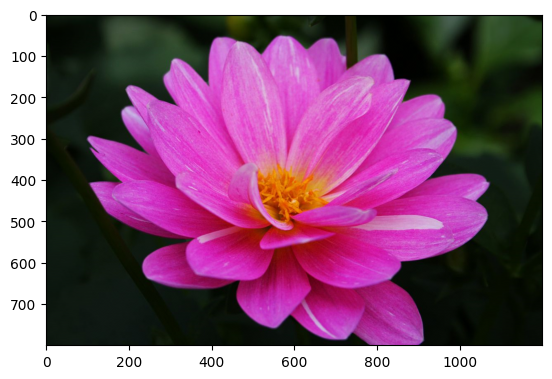

350
Result:


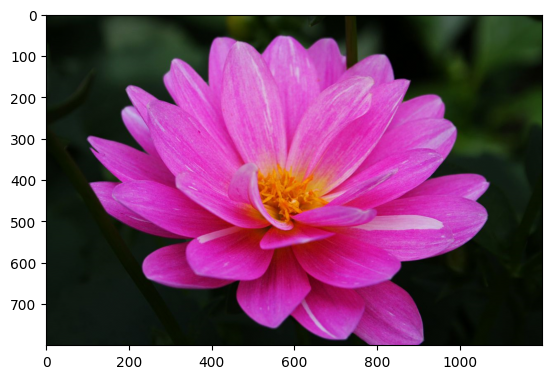

400
Result:


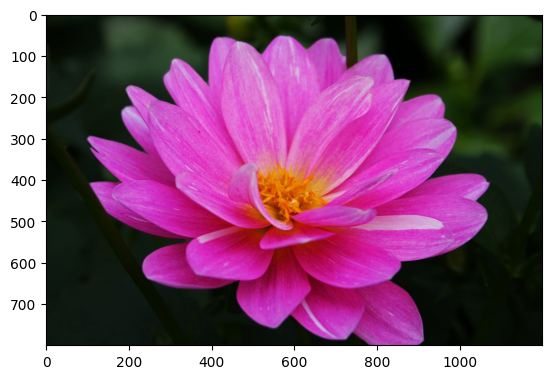

450
Result:


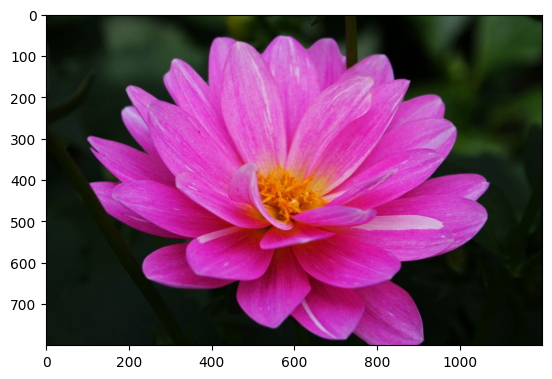

500
Result:


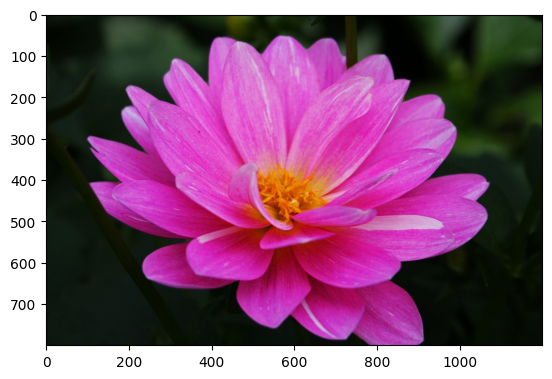

550
Result:


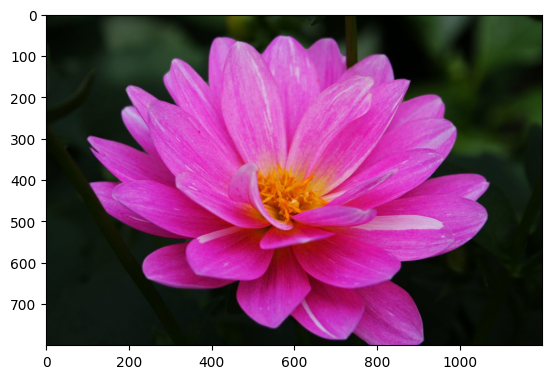

600
Result:


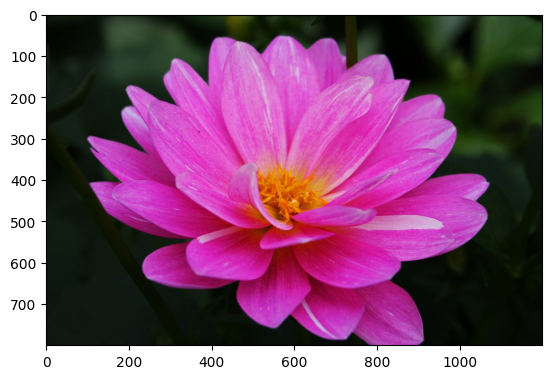

650
Result:


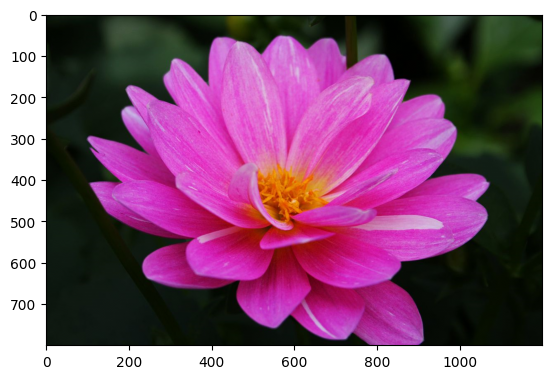

700
Result:


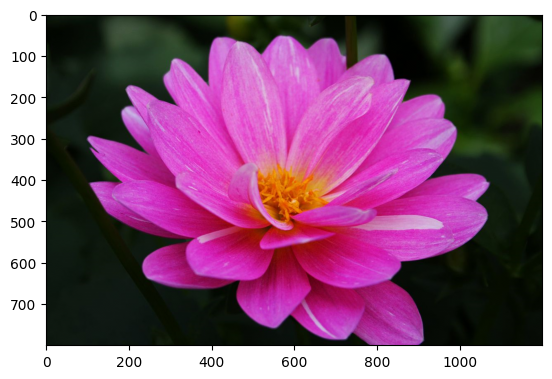

750
Result:


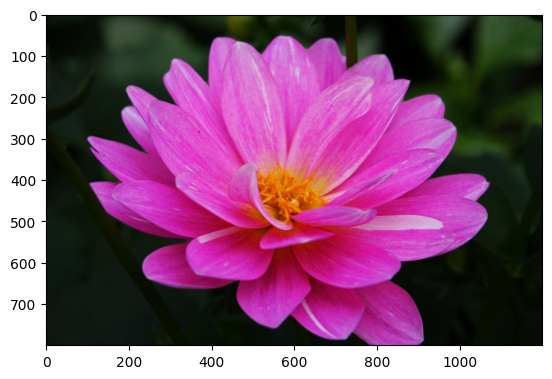

In [82]:
print('Source:')
plt.imshow(img)
plt.show()

for n in np.arange(50, img.shape[0], 50):
    pca_r = PCA(n_components=n)
    new_r = pca_r.inverse_transform(pca_r.fit_transform(r))

    pca_g = PCA(n_components=n)
    new_g = pca_g.inverse_transform(pca_g.fit_transform(g))

    pca_b = PCA(n_components=n)
    new_b = pca_b.inverse_transform(pca_b.fit_transform(b))

    new_img = np.array([new_r, new_g, new_b])
    new_img = new_img.transpose(1, 2, 0)
    
    print(n)
    
    print('Result:')
    plt.imshow(new_img)
    plt.show()